In [1]:
import os
from test import separate
from scipy.io import wavfile
from IPython.display import Audio
import numpy as np
import museval
import matplotlib.pyplot as plt
from matplotlib import ticker
import pandas as pd
from glob import glob
from tqdm import tqdm
import seaborn as sns

In [2]:
podcast_path = '/home/seth/datasets/open-unmix/data/train/podcasts'
interfer_path = '/home/seth/datasets/open-unmix/data/train/interfer'

In [5]:
inters = ['1-9841-A-13.wav',
          '3-68630-C-40.wav',
          '1-31251-A-6.wav',
          '1-54084-A-42.wav',
          '1-17808-A-12.wav']
inters = [os.path.join(interfer_path, x) for x in inters]

In [6]:
pod_sample = []
int_sample = []

for ix, i in enumerate(range(600, 605, 1)):
    rate, wav = wavfile.read(os.path.join(podcast_path, 'bob_lazar_{}.wav'.format(i)))
    pod_sample.append(wav)
    rate, wav = wavfile.read(inters[ix])
    int_sample.append(wav)

In [7]:
pod_wav = np.concatenate(pod_sample, axis=0)
int_wav = np.concatenate(int_sample, axis=0)

In [8]:
display(Audio(pod_wav, rate=rate))

In [9]:
display(Audio(int_wav, rate=rate))

In [10]:
doc_path = '/home/seth/Documents/youtube/open-unmix-pytorch/docs'
wavfile.write(os.path.join(doc_path, 'pod_sample.wav'), rate, pod_wav)
wavfile.write(os.path.join(doc_path, 'int_sample.wav'), rate, int_wav)

In [11]:
print(type(pod_wav[0]))

<class 'numpy.int16'>


In [12]:
mix = pod_wav + int_wav

In [13]:
display(Audio(mix, rate=rate))

In [14]:
mix = np.expand_dims(mix, axis=1)
print(mix.shape)

(1102500, 1)


In [15]:
estimates = separate(audio=mix,
                     targets=['podcasts'],
                     model_name='open-unmix-512',
                     device='cuda')

In [16]:
for target, estimate in estimates.items():
    print(target)
    display(Audio(estimate.squeeze(), rate=rate))

podcasts


accompaniment


In [99]:
pod_target = estimates['podcasts'].squeeze().astype('int16')
doc_path = '/home/seth/Documents/youtube/open-unmix-pytorch/docs'
wavfile.write(os.path.join(doc_path, 'target_sample.wav'), rate, pod_target)

### Calculate SDR for entire ESC-50 dataset

In [15]:
class AudioSample:
    def __init__(self, fn):
        self.fn = fn
        self.inter = wavfile.read(os.path.join('/home/seth/datasets/open-unmix/ESC-50/audio', fn))[1]

In [16]:
df = pd.read_csv(os.path.join('/home/seth/datasets/open-unmix', 'ESC-50', 'meta', 'esc50.csv'))
cls2data = {}

inter_dirs = np.unique(df.category).tolist()

for cat in inter_dirs:
    df_cat = df[df.category==cat]
    cls2data[cat] = []
    for fn in df_cat.filename.values:
        cls2data[cat].append(AudioSample(fn))

In [17]:
pod_samples = glob(podcast_path+'/*')[:40]
pod_samples = [wavfile.read(x)[1] for x in pod_samples]

In [18]:
# seems weird to force the user to re-load the model everytime instead of feeding data
# into the model but I didn't write test.py so here it goes...

cls2res = {}

for k, v in tqdm(cls2data.items()):
    
    mixture = []
    pod_arr = []
    
    for i in range(len(v)):
        pod = pod_samples[i]
        inter = v[i].inter
        mix = np.expand_dims(pod + inter, axis=1)
        mixture.append(mix)
        pod = np.expand_dims(pod, axis=1)
        pod_arr.append(pod)
    
    pod = np.array(pod_arr)
    pod = np.concatenate(pod, axis=0)
    
    mix = np.array(mixture)
    mix = np.concatenate(mix, axis=0)

    estimates = separate(audio=mix,
                         targets=['podcasts'],
                         model_name='open-unmix-512',
                         device='cuda')
    
    results = museval.evaluate(references=pod.T,
                               estimates=estimates['podcasts'].T,
                               hop=44100)
    cls2res[k] = list(results[0].flatten())

100%|██████████| 50/50 [14:56<00:00, 17.80s/it]


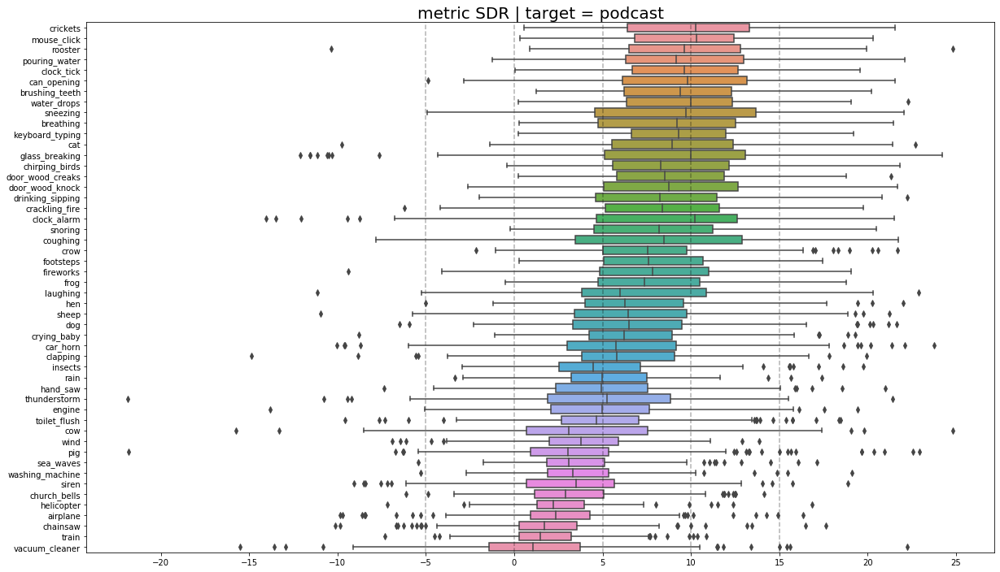

In [54]:
sorted_cls2res = {k: v for k, v in sorted(cls2res.items(), key=lambda x: -np.mean(x[1]))}

x = list(sorted_cls2res.values())
y = list(sorted_cls2res.keys())

figure, ax = plt.subplots(figsize=(20,12))
plt.title('metric SDR | target = podcast', size=20)
for i in range(-5, 20, 5):
    plt.axvline(x=i, color='k', linestyle='--', alpha=0.3)
sns.boxplot(x=x, y=y)
ax.xaxis.set_major_locator(ticker.MultipleLocator(5))
plt.show()